In [1]:
import sys
print(sys.version)

3.11.7 (main, Jan 26 2024, 09:19:59) [Clang 13.1.6 (clang-1316.0.21.2.5)]


In [27]:
# library imports
import seaborn as sns
import pandas as pd
# ------
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
# ------
pd.set_option('display.max_rows',None)

In [3]:
def to_camel_case(stringparam):
    # Remove leading/trailing whitespace and split the word

    words = stringparam.strip().split(' ')

    # Capitalize each word except the first one
    capitalized_words = [words[0].lower()] + [w.capitalize() for w in words[1:]]

    # Join the capitalized words without spaces
    camel_case_word = ''.join(capitalized_words)
    return camel_case_word

def remove_characters(mystr, schar_string,replace_by=''):
    newstring = mystr
    for char in schar_string:
        newstring = newstring.replace(char,replace_by)
    return newstring

In [4]:
sales = pd.read_csv('../data/Amazon Sale Report.csv', low_memory=False)

In [5]:
sales.sample(5).T

,7641,97927,77119,11534,116151
index,7641,97927,77119,11534,116151
Order ID,402-0037257-0493912,403-6838445-1052311,407-2472416-4797118,408-9700048-3361124,402-7652921-7222735
Date,04-25-22,06-23-22,05-09-22,04-23-22,06-09-22
Status,Cancelled,Shipped,Shipped,Shipped - Delivered to Buyer,Shipped
Fulfilment,Merchant,Amazon,Amazon,Merchant,Amazon
Sales Channel,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in
ship-service-level,Standard,Expedited,Expedited,Standard,Expedited
Style,SET145,JNE3765,JNE3617,SET397,SET331
SKU,SET145-KR-NP-M,JNE3765-KR-XL,JNE3617-KR-XL,SET397-KR-NP -M,SET331-KR-NP-XXXL
Category,Set,kurta,kurta,Set,Set


In [6]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128975 entries, 0 to 128974
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128975 non-null  int64  
 1   Order ID            128975 non-null  object 
 2   Date                128975 non-null  object 
 3   Status              128975 non-null  object 
 4   Fulfilment          128975 non-null  object 
 5   Sales Channel       128975 non-null  object 
 6   ship-service-level  128975 non-null  object 
 7   Style               128975 non-null  object 
 8   SKU                 128975 non-null  object 
 9   Category            128975 non-null  object 
 10  Size                128975 non-null  object 
 11  ASIN                128975 non-null  object 
 12  Courier Status      122103 non-null  object 
 13  Qty                 128975 non-null  int64  
 14  currency            121180 non-null  object 
 15  Amount              121180 non-nul

In [7]:
sales = sales.drop('Unnamed: 22',axis=1)

In [8]:
dtypes = {
    'Order ID': 'str',
    'Date': 'datetime64[ns]',
    'Status': 'category',
    'Fulfilment': 'category',
    'Sales Channel ': 'category',
    'ship-service-level': 'category',
    'Style': 'category',
    'SKU': 'category',
    'Category': 'category',
    'Size': 'category',
    'ASIN': 'category',
    'Courier Status': 'category',
    'currency': 'category',
    'ship-city': 'category',
    'ship-state': 'category',
    'ship-country': 'category',
    'promotion-ids': 'category',
    'fulfilled-by': 'category',
    'Qty': 'int32',
    'Amount': 'float64',
    'ship-postal-code': 'object',
    'B2B': 'bool'
}
sales = sales.astype(dtypes)
# sales = pd.read_csv('path_to_file.csv', dtype=dtype_dict, parse_dates=['Date'])

In [9]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128975 entries, 0 to 128974
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   index               128975 non-null  int64         
 1   Order ID            128975 non-null  object        
 2   Date                128975 non-null  datetime64[ns]
 3   Status              128975 non-null  category      
 4   Fulfilment          128975 non-null  category      
 5   Sales Channel       128975 non-null  category      
 6   ship-service-level  128975 non-null  category      
 7   Style               128975 non-null  category      
 8   SKU                 128975 non-null  category      
 9   Category            128975 non-null  category      
 10  Size                128975 non-null  category      
 11  ASIN                128975 non-null  category      
 12  Courier Status      122103 non-null  category      
 13  Qty                 128975 no

In [10]:
# map camelcase function to list
renames=[to_camel_case(remove_characters(x,"-:",replace_by=" ")) for x in sales.columns.tolist()]
# create a dictionary to rename column names
colNames = dict(zip(sales.columns.tolist(),renames))

In [11]:
# inspect results
colNames

{'index': 'index',
 'Order ID': 'orderId',
 'Date': 'date',
 'Status': 'status',
 'Fulfilment': 'fulfilment',
 'Sales Channel ': 'salesChannel',
 'ship-service-level': 'shipServiceLevel',
 'Style': 'style',
 'SKU': 'sku',
 'Category': 'category',
 'Size': 'size',
 'ASIN': 'asin',
 'Courier Status': 'courierStatus',
 'Qty': 'qty',
 'currency': 'currency',
 'Amount': 'amount',
 'ship-city': 'shipCity',
 'ship-state': 'shipState',
 'ship-postal-code': 'shipPostalCode',
 'ship-country': 'shipCountry',
 'promotion-ids': 'promotionIds',
 'B2B': 'b2b',
 'fulfilled-by': 'fulfilledBy'}

In [12]:
sales = sales.rename(columns = colNames)

In [13]:
sales.head().T

,0,1,2,3,4
index,0,1,2,3,4
orderId,405-8078784-5731545,171-9198151-1101146,404-0687676-7273146,403-9615377-8133951,407-1069790-7240320
date,2022-04-30 00:00:00,2022-04-30 00:00:00,2022-04-30 00:00:00,2022-04-30 00:00:00,2022-04-30 00:00:00
status,Cancelled,Shipped - Delivered to Buyer,Shipped,Cancelled,Shipped
fulfilment,Merchant,Merchant,Amazon,Merchant,Amazon
salesChannel,Amazon.in,Amazon.in,Amazon.in,Amazon.in,Amazon.in
shipServiceLevel,Standard,Standard,Expedited,Standard,Expedited
style,SET389,JNE3781,JNE3371,J0341,JNE3671
sku,SET389-KR-NP-S,JNE3781-KR-XXXL,JNE3371-KR-XL,J0341-DR-L,JNE3671-TU-XXXL
category,Set,kurta,kurta,Western Dress,Top


In [14]:
sales.nunique()

index               128975
orderId             120378
date                    91
status                  13
fulfilment               2
salesChannel             2
shipServiceLevel         2
style                 1377
sku                   7195
category                 9
size                    11
asin                  7190
courierStatus            3
qty                     10
currency                 1
amount                1410
shipCity              8955
shipState               69
shipPostalCode        9459
shipCountry              1
promotionIds          5787
b2b                      2
fulfilledBy              1
dtype: int64

In [15]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128975 entries, 0 to 128974
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   index             128975 non-null  int64         
 1   orderId           128975 non-null  object        
 2   date              128975 non-null  datetime64[ns]
 3   status            128975 non-null  category      
 4   fulfilment        128975 non-null  category      
 5   salesChannel      128975 non-null  category      
 6   shipServiceLevel  128975 non-null  category      
 7   style             128975 non-null  category      
 8   sku               128975 non-null  category      
 9   category          128975 non-null  category      
 10  size              128975 non-null  category      
 11  asin              128975 non-null  category      
 12  courierStatus     122103 non-null  category      
 13  qty               128975 non-null  int32         
 14  curr

In [16]:
def dataframe_overview(df):
    return pd.DataFrame({
        'Column': df.columns,
        'Dtype': df.dtypes,
        'Nunique': df.nunique()
    }).set_index('Column')

In [17]:
df_overview =dataframe_overview(sales).reset_index()

In [18]:
df_overview

,Column,Dtype,Nunique
0,index,int64,128975
1,orderId,object,120378
2,date,datetime64[ns],91
3,status,category,13
4,fulfilment,category,2
5,salesChannel,category,2
6,shipServiceLevel,category,2
7,style,category,1377
8,sku,category,7195
9,category,category,9


In [19]:
df_overview['new_type'] = df_overview.apply(lambda x: 'object' if x['Dtype']=='category' and x['Nunique']>100 else x['Dtype'], axis =1)

In [20]:
df_overview

,Column,Dtype,Nunique,new_type
0,index,int64,128975,int64
1,orderId,object,120378,object
2,date,datetime64[ns],91,datetime64[ns]
3,status,category,13,category
4,fulfilment,category,2,category
5,salesChannel,category,2,category
6,shipServiceLevel,category,2,category
7,style,category,1377,object
8,sku,category,7195,object
9,category,category,9,category


In [21]:
sales = sales.astype(dict(zip(df_overview['Column'],df_overview['new_type']))) 

In [22]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128975 entries, 0 to 128974
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   index             128975 non-null  int64         
 1   orderId           128975 non-null  object        
 2   date              128975 non-null  datetime64[ns]
 3   status            128975 non-null  category      
 4   fulfilment        128975 non-null  category      
 5   salesChannel      128975 non-null  category      
 6   shipServiceLevel  128975 non-null  category      
 7   style             128975 non-null  object        
 8   sku               128975 non-null  object        
 9   category          128975 non-null  category      
 10  size              128975 non-null  category      
 11  asin              128975 non-null  object        
 12  courierStatus     122103 non-null  category      
 13  qty               128975 non-null  int32         
 14  curr

In [23]:
sales.to_csv('../python_output/sales_cleaned.csv')

OSError: Cannot save file into a non-existent directory: '../python_output'

In [129]:
# Convert categorical columns to one-hot encoded columns
one_hot_encoded_df = pd.get_dummies(sales.select_dtypes(include=['category']))

# Calculate the correlation matrix
correlation_matrix = one_hot_encoded_df.corr()

In [130]:
correlation_matrix

,Status_Cancelled,Status_Pending,Status_Pending - Waiting for Pick Up,Status_Shipped,Status_Shipped - Damaged,Status_Shipped - Delivered to Buyer,Status_Shipped - Lost in Transit,Status_Shipped - Out for Delivery,Status_Shipped - Picked Up,Status_Shipped - Rejected by Buyer,...,ship-state_WEST BENGAL,ship-state_bihar,ship-state_delhi,ship-state_goa,ship-state_orissa,ship-state_punjab,ship-state_rajasthan,ship-state_rajsthan,ship-country_IN,fulfilled-by_Easy Ship
Status_Cancelled,1.000000,-0.029148,-0.019020,-0.501917,-0.001133,-0.218101,-0.002534,-0.006706,-0.035489,-0.003759,...,0.003853,-0.001133,-0.001714,-0.002534,-0.001133,-0.002110,-0.002776,-0.001133,-0.003206,0.061676
Status_Pending,-0.029148,1.000000,-0.003346,-0.088300,-0.000199,-0.038370,-0.000446,-0.001180,-0.006243,-0.000661,...,0.001336,-0.000199,-0.000914,-0.000446,-0.000199,-0.000746,-0.000488,-0.000199,0.001146,0.010078
Status_Pending - Waiting for Pick Up,-0.019020,-0.003346,1.000000,-0.057619,-0.000130,-0.025037,-0.000291,-0.000770,-0.004074,-0.000432,...,-0.002369,-0.000130,-0.000596,-0.000291,-0.000130,-0.000487,-0.000319,-0.000130,0.000748,0.070615
Status_Shipped,-0.501917,-0.088300,-0.057619,1.000000,-0.003434,-0.660700,-0.007678,-0.020316,-0.107507,-0.011388,...,0.004289,-0.003434,0.001654,0.005050,-0.003434,-0.002199,-0.001439,0.002258,0.003872,-0.815956
Status_Shipped - Damaged,-0.001133,-0.000199,-0.000130,-0.003434,1.000000,-0.001492,-0.000017,-0.000046,-0.000243,-0.000026,...,-0.000613,-0.000008,-0.000036,-0.000017,-0.000008,-0.000029,-0.000019,-0.000008,0.000045,0.004208
Status_Shipped - Delivered to Buyer,-0.218101,-0.038370,-0.025037,-0.660700,-0.001492,1.000000,-0.003336,-0.008828,-0.046716,-0.004949,...,-0.011628,0.005197,-0.002459,-0.003336,0.005197,0.005144,0.004538,-0.001492,0.000420,0.809725
Status_Shipped - Lost in Transit,-0.002534,-0.000446,-0.000291,-0.007678,-0.000017,-0.003336,1.000000,-0.000103,-0.000543,-0.000058,...,-0.001371,-0.000017,-0.000079,-0.000039,-0.000017,-0.000065,-0.000042,-0.000017,0.000100,0.009409
Status_Shipped - Out for Delivery,-0.006706,-0.001180,-0.000770,-0.020316,-0.000046,-0.008828,-0.000103,1.000000,-0.001436,-0.000152,...,-0.001386,-0.000046,-0.000210,-0.000103,-0.000046,-0.000172,-0.000112,-0.000046,0.000264,0.024898
Status_Shipped - Picked Up,-0.035489,-0.006243,-0.004074,-0.107507,-0.000243,-0.046716,-0.000543,-0.001436,1.000000,-0.000805,...,0.005553,-0.000243,0.005910,-0.000543,-0.000243,-0.000908,-0.000595,-0.000243,0.001395,0.131756
Status_Shipped - Rejected by Buyer,-0.003759,-0.000661,-0.000432,-0.011388,-0.000026,-0.004949,-0.000058,-0.000152,-0.000805,1.000000,...,-0.002033,-0.000026,-0.000118,-0.000058,-0.000026,-0.000096,-0.000063,-0.000026,0.000148,0.013957


In [120]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [131]:
df = sales.select_dtypes(include=['category'])
# Create an empty DataFrame to store Cramér's V values
cramers_v_matrix = pd.DataFrame(data=np.zeros((df.columns.size, df.columns.size)), columns=df.columns, index=df.columns)

# Populate the matrix with Cramér's V values
for col in df.columns:
    for row in df.columns:
        cramers_v_matrix.at[col, row] = cramers_v(df[col], df[row])

# Display the matrix
# print(cramers_v_matrix)


/var/folders/m2/zsnz09011cdf41qc85j1zhzm0000gn/T/ipykernel_45112/1108377572.py:10: RuntimeWarning: invalid value encountered in scalar divide
  return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))
/var/folders/m2/zsnz09011cdf41qc85j1zhzm0000gn/T/ipykernel_45112/1108377572.py:10: RuntimeWarning: invalid value encountered in scalar divide
  return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))
/var/folders/m2/zsnz09011cdf41qc85j1zhzm0000gn/T/ipykernel_45112/1108377572.py:10: RuntimeWarning: invalid value encountered in scalar divide
  return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))
/var/folders/m2/zsnz09011cdf41qc85j1zhzm0000gn/T/ipykernel_45112/1108377572.py:10: RuntimeWarning: invalid value encountered in scalar divide
  return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))
/var/folders/m2/zsnz09011cdf41qc85j1zhzm0000gn/T/ipykernel_45112/1108377572.py:10: RuntimeWarning: invalid value encountered in scalar divide
  return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))
/var/folders/m2

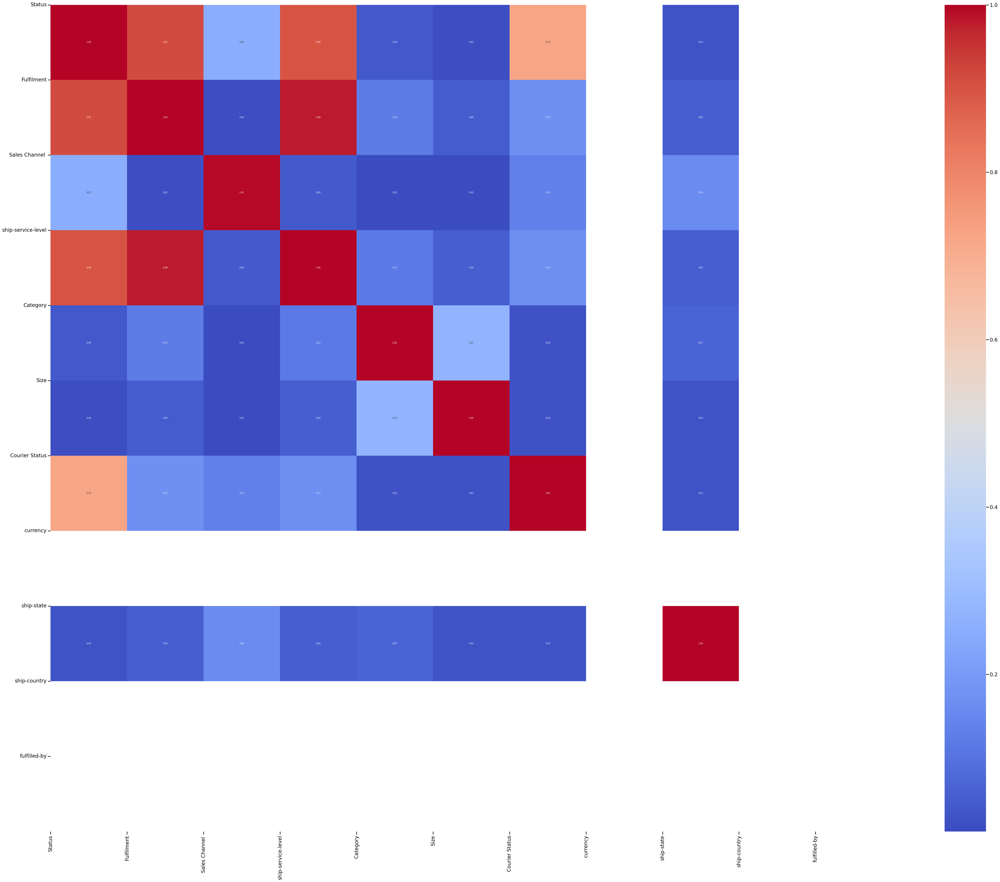

In [132]:
# Set the context to "talk" for larger labels, suitable for a large heatmap
sns.set_context('talk')

# Increase figure size - width and height are set larger to accommodate 114 categories
plt.figure(figsize=(50, 40))

# Create the heatmap with annotations inside the cells and a smaller annotation font size
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap='coolwarm', annot_kws={"size": 7})

# Rotate x-axis labels to 90 degrees to avoid overlap, y-axis labels to 0 for readability
plt.xticks(ticks=np.arange(len(cramers_v_matrix.columns)), labels=cramers_v_matrix.columns, rotation=90)
plt.yticks(ticks=np.arange(len(cramers_v_matrix.index)), labels=cramers_v_matrix.index, rotation=0)

# Ensure the entire plot fits into the figure area
plt.tight_layout()

# Save the figure with a high dpi (dots per inch) to ensure labels are readable
plt.savefig('./heatmap_large.png', dpi=300)

# Show the plot
plt.show()


In [28]:
# missing values
def heatmap(data):
    """[displays a heatmap of missing data inside a dataset]

        Args:
            data ([type]): [description]"""

    sns.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')

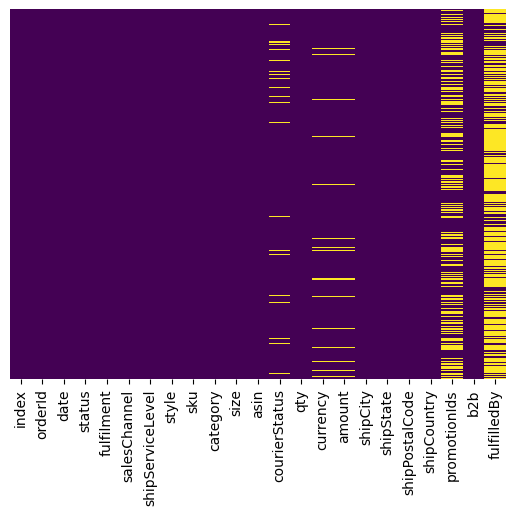

In [29]:
heatmap(sales)

In [31]:
len(sales.columns.tolist())

23

In [33]:
sales.columns.tolist()

['index',
 'orderId',
 'date',
 'status',
 'fulfilment',
 'salesChannel',
 'shipServiceLevel',
 'style',
 'sku',
 'category',
 'size',
 'asin',
 'courierStatus',
 'qty',
 'currency',
 'amount',
 'shipCity',
 'shipState',
 'shipPostalCode',
 'shipCountry',
 'promotionIds',
 'b2b',
 'fulfilledBy']

In [41]:
len(sales[['shipCity','shipState','shipPostalCode']].drop_duplicates())

18230

In [42]:
counts = sales[['shipCity','shipState','shipPostalCode']].value_counts(dropna=False)

# Print the counts
print("Count of unique values:")
print(counts.iloc[0])  # Count of unique values for each column
print("\nCount of unique combinations:")
print(counts.iloc[1:]) 

Count of unique values:
1

Count of unique combinations:


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [95]:
sorted_sales = sales[['shipState','shipCity','shipPostalCode']].sort_values(by=['shipState','shipCity','shipPostalCode'])
result = sorted_sales.groupby(['shipState'], observed=True,as_index=False).agg(count=('shipCity', 'nunique'))
# result = sorted_sales.groupby(['shipState', 'shipCity'], observed=True,as_index=False).agg(count=('shipPostalCode', 'nunique'))

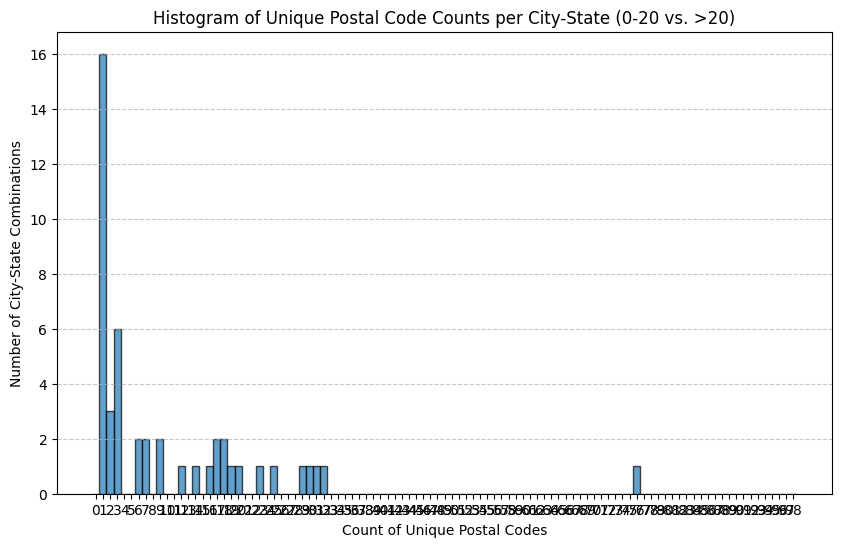

In [97]:
import matplotlib.pyplot as plt
import numpy as np

# Sort your result dataframe by the 'count' column in descending order
sorted_result = result.sort_values(by=['count'], ascending=False)

# Define your desired bins: 0-20 and >20
bins = np.arange(0, 100)  # Create bins from 0 to 21 (inclusive)

# Count occurrences within each bin
counts, _ = np.histogram(sorted_result['count'], bins=bins)

# Create and customize the histogram
plt.figure(figsize=(10, 6))
plt.bar(bins[:-1], counts, width=bins[1] - bins[0], edgecolor='black', alpha=0.7)
plt.xlabel('Count of Unique Postal Codes')
plt.ylabel('Number of City-State Combinations')
plt.title('Histogram of Unique Postal Code Counts per City-State (0-20 vs. >20)')
plt.xticks(bins[:-1])  # Set tick positions based on bin edges
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


As the majority of frequencies is 1, it is most efficient to use a location Dimension

In [73]:
sales[['shipState','shipCity','shipPostalCode']].sort_values(by=['shipState','shipCity','shipPostalCode']).reset_index().value_counts(dropna=False)

index   shipState               shipCity                                            shipPostalCode
0       MAHARASHTRA             MUMBAI                                              400081.0          1
85979   KARNATAKA               BENGALURU                                           560015.0          1
85992   Gujarat                 VIRPUR                                              388260.0          1
85991   MAHARASHTRA             PUNE                                                411052.0          1
85990   MAHARASHTRA             MUMBAI                                              400016.0          1
85989   Gujarat                 BHARUCH                                             392015.0          1
85988   MAHARASHTRA             KALYAN EAST                                         421306.0          1
85987   RAJASTHAN               Churu                                               331701.0          1
85986   TELANGANA               HYDERABAD                            

In [45]:
sales[['shipCity','shipState']].value_counts(dropna=False)

shipCity                                            shipState             
BENGALURU                                           KARNATAKA                 11217
HYDERABAD                                           TELANGANA                  8065
MUMBAI                                              MAHARASHTRA                6126
NEW DELHI                                           DELHI                      5785
CHENNAI                                             TAMIL NADU                 5421
PUNE                                                MAHARASHTRA                3857
KOLKATA                                             WEST BENGAL                2381
GURUGRAM                                            HARYANA                    1868
THANE                                               MAHARASHTRA                1701
LUCKNOW                                             UTTAR PRADESH              1458
NOIDA                                               UTTAR PRADESH              1419
G